In [40]:
#%matplotlib widget
import numpy as np
import matplotlib.pyplot as plt
import firtez_dz as frz
from astropy.io import fits
from matplotlib.colors import CenteredNorm, TwoSlopeNorm
np.random.seed(123)

In [2]:
plt.rc('text', usetex = False)

In [3]:
muramdir = '/dat/milic/MURaM_400G_plage_pore/'

In [4]:
time = np.fromfile(muramdir+'2D/Pore_10Mm_6x6km_res_Bz400G_time_012000_to_044450.dat',dtype=np.float64)

In [5]:
nsnaps = time.size //2

In [6]:
time = time.reshape(2,nsnaps)

In [8]:
time

array([[12000.        , 12050.        , 12100.        , ...,
        44350.        , 44400.        , 44450.        ],
       [  152.20344543,   153.64291382,   155.08125305, ...,
         1073.94689941,  1075.36816406,  1076.78955078]])

In [12]:
time[1,280]

552.0895385742188

In [13]:
time[0,280]

26000.0

In [8]:
time[0,320]

28000.0

In [45]:
time[0,360]

30000.0

In [16]:
time[1,320]

609.0150756835938

In [10]:
time[1,160]

381.4553527832031

In [10]:
np.diff(time[1,:])

array([1.43946838, 1.43833923, 1.43930054, 1.44206238, 1.44306946,
       1.44387817, 1.4447937 , 1.44424438, 1.44386292, 1.44450378,
       1.44474792, 1.44544983, 1.44471741, 1.44487   , 1.4442749 ,
       1.44366455, 1.44445801, 1.44624329, 1.44740295, 1.44715881,
       1.44754028, 1.44822693, 1.44737244, 1.44784546, 1.44850159,
       1.44917297, 1.44900513, 1.44917297, 1.44880676, 1.44883728,
       1.44975281, 1.44946289, 1.44963074, 1.45231628, 1.45274353,
       1.45143127, 1.45071411, 1.45043945, 1.45108032, 1.44909668,
       1.44602966, 1.4377594 , 1.43107605, 1.42451477, 1.41720581,
       1.41822815, 1.42094421, 1.42858887, 1.42770386, 1.42893982,
       1.42980957, 1.42932129, 1.43533325, 1.44184875, 1.4382782 ,
       1.44165039, 1.44743347, 1.44361877, 1.43962097, 1.43589783,
       1.44177246, 1.44058228, 1.43788147, 1.43609619, 1.43391418,
       1.43127441, 1.42953491, 1.42739868, 1.42697144, 1.42720032,
       1.42713928, 1.42597961, 1.42599487, 1.42553711, 1.42504

In [8]:
time[1,100]-time[1,99]

1.427642822265625

In [7]:
nx = 1536
ny = 1536
nz = 1056

In [ ]:
slice = np.memmap(muramdir+'2D/Pore_10Mm_6x6km_res_Bz400G_x_0720_bx_012000_to_044450.dat',dtype=np.float32,mode='r',shape=(nsnaps,nx,ny))

In [15]:
Ic = np.memmap(muramdir+'2D/Pore_10Mm_6x6km_res_Bz400G_Iout_bref_012000_to_044450.dat',dtype=np.float32,mode='r',shape=(nsnaps,nx,ny))

In [21]:
slicez = np.memmap(muramdir+'2D/Pore_10Mm_6x6km_res_Bz400G_tau_1.000_vx_012000_to_044450.dat',dtype=np.float32,mode='r',shape=(nsnaps,nx,ny))

In [ ]:
slice = np.memmap(muramdir+'2D/Pore_10Mm_6x6km_res_Bz400G_tau_1.000_bx_012000_to_044450.dat',dtype=np.float32,mode='r',shape=(nsnaps,nx,ny))

In [9]:
slicex = np.memmap(muramdir+'2D/Pore_10Mm_6x6km_res_Bz400G_tau_1.000_by_012000_to_044450.dat',dtype=np.float32,mode='r',shape=(nsnaps,nx,ny))

In [10]:
slicey = np.memmap(muramdir+'2D/Pore_10Mm_6x6km_res_Bz400G_tau_1.000_bz_012000_to_044450.dat',dtype=np.float32,mode='r',shape=(nsnaps,nx,ny))

In [8]:
slice = np.memmap(muramdir+'2D/Pore_10Mm_6x6km_res_Bz400G_tau_1.000_vx_012000_to_044450.dat',dtype=np.float32,mode='r',shape=(nsnaps,nx,ny))

In [8]:
bx = np.memmap(muramdir+'2D/Pore_10Mm_6x6km_res_Bz400G_z_0768_by_012000_to_044450.dat',dtype=np.float32,mode='r',shape=(nsnaps,ny,nz))

In [9]:
bz = np.memmap(muramdir+'2D/Pore_10Mm_6x6km_res_Bz400G_z_0768_bx_012000_to_044450.dat',dtype=np.float32,mode='r',shape=(nsnaps,ny,nz))

In [11]:
vz = np.memmap(muramdir+'2D/Pore_10Mm_6x6km_res_Bz400G_z_0768_vx_012000_to_044450.dat',dtype=np.float32,mode='r',shape=(nsnaps,ny,nz))

In [12]:
vx = np.memmap(muramdir+'2D/Pore_10Mm_6x6km_res_Bz400G_z_0768_vy_012000_to_044450.dat',dtype=np.float32,mode='r',shape=(nsnaps,ny,nz))

In [9]:
tau = np.memmap(muramdir+'2D/Pore_10Mm_6x6km_res_Bz400G_z_0768_tau_012000_to_044450.dat',dtype=np.float32,mode='r',shape=(nsnaps,ny,nz))

In [50]:
slice.shape

(650, 1536, 1536)

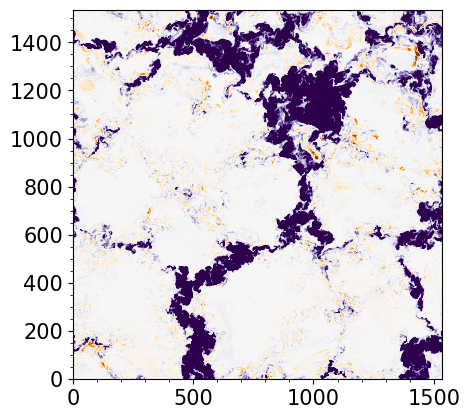

In [17]:
# x 720
plt.imshow(slice[360,:,:].T,origin='lower',cmap='PuOr',vmax=500,vmin=-500)
#plt.colorbar(location='bottom')

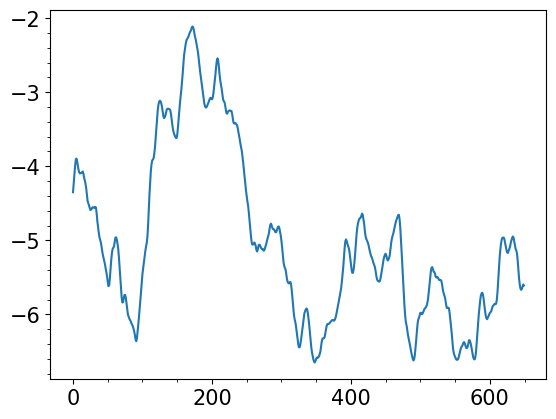

In [29]:
# tau = 1
plt.plot(np.mean(slice,axis=(1,2))*np.sqrt(4*np.pi))
#plt.xlim([0,50])

In [33]:
50/3*1.43

23.833333333333336

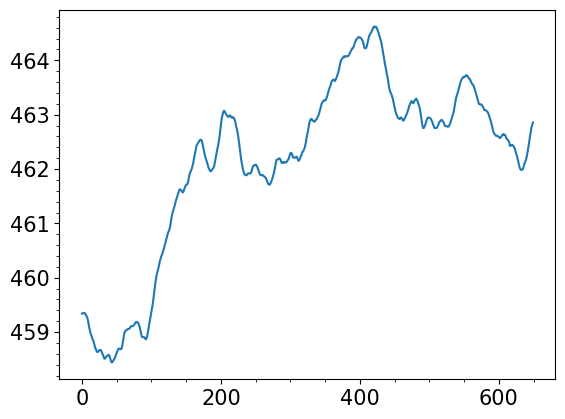

In [27]:
# tau = 1
plt.plot(np.mean(np.abs(slice),axis=(1,2))*np.sqrt(4*np.pi))

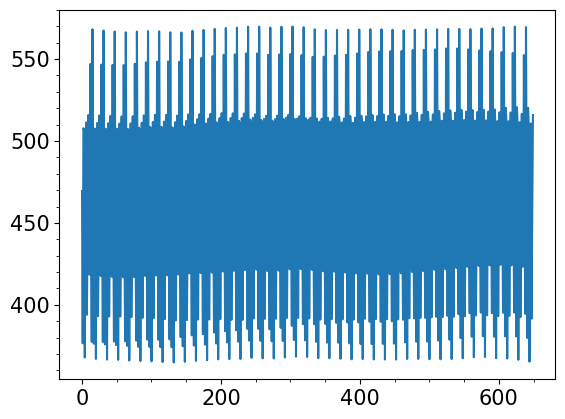

In [ ]:
# tau = 1
plt.plot(np.mean(np.abs(slice),axis=(1,2))*np.sqrt(4*np.pi))

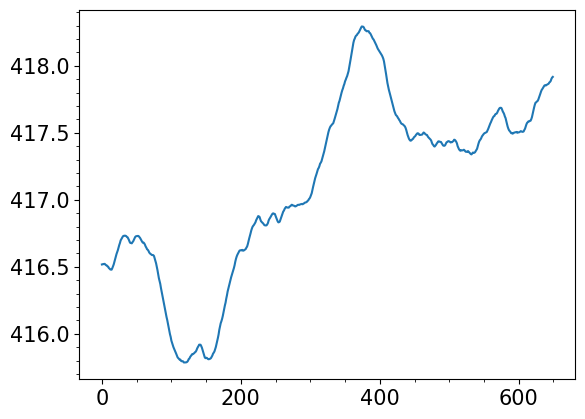

In [ ]:
#x = 820 mean unsigned vertical magnetic field
plt.plot(np.mean(np.abs(slice),axis=(1,2))*np.sqrt(4*np.pi))

In [27]:
np.mean(np.mean(slice,axis=(1,2)))*np.sqrt(4*np.pi)

420.06891220566274

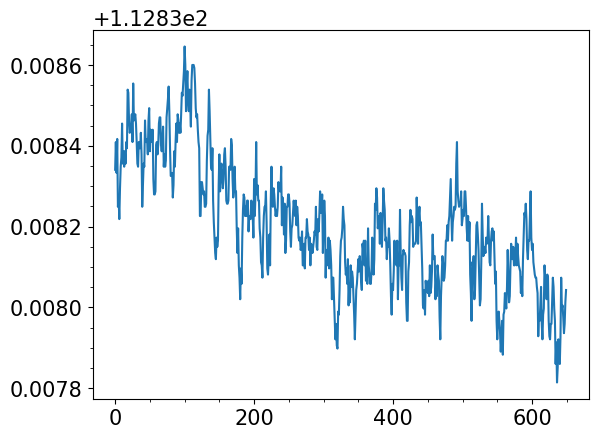

In [18]:
plt.plot(np.mean(slice,axis=(1,2)))

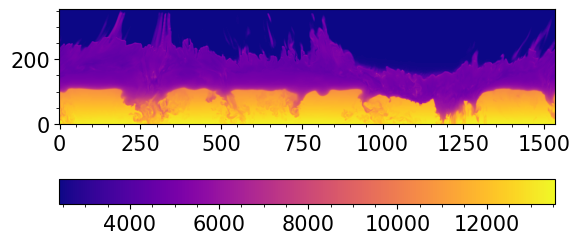

In [ ]:
# y 1152
plt.imshow(slice[360,:,700:].T,origin='lower',cmap='plasma')
plt.colorbar(location='bottom')

(1000.0, 1400.0)

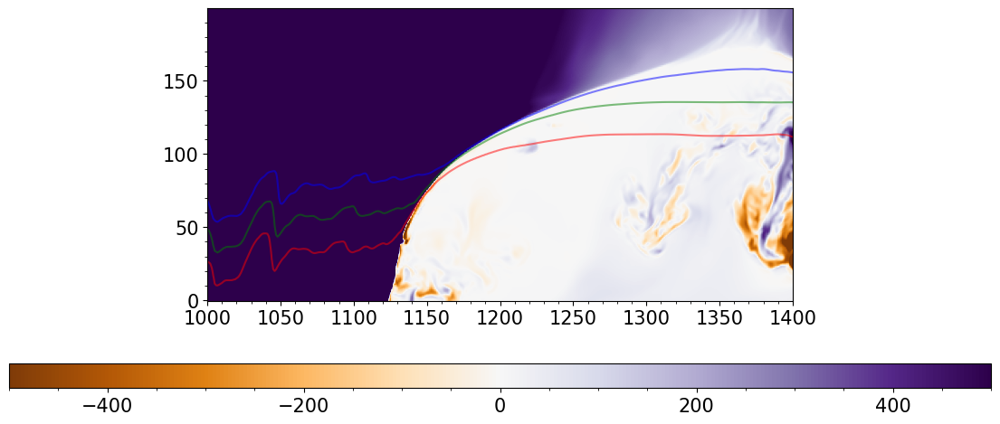

In [27]:
# y 1152
plt.figure(figsize=(14,6))
plt.imshow(bz[500,:,700:900].T*np.sqrt(4*np.pi),origin='lower',cmap='PuOr',norm=TwoSlopeNorm(vmin=-500,vcenter=0,vmax=500))
plt.colorbar(location='bottom',aspect=40)
plt.contour(tau[500,:,700:900].T,levels=[0.01,0.1,1],colors=['blue','green','red'],alpha=0.5)
plt.xlim([1000,1400])

(900.0, 1400.0)

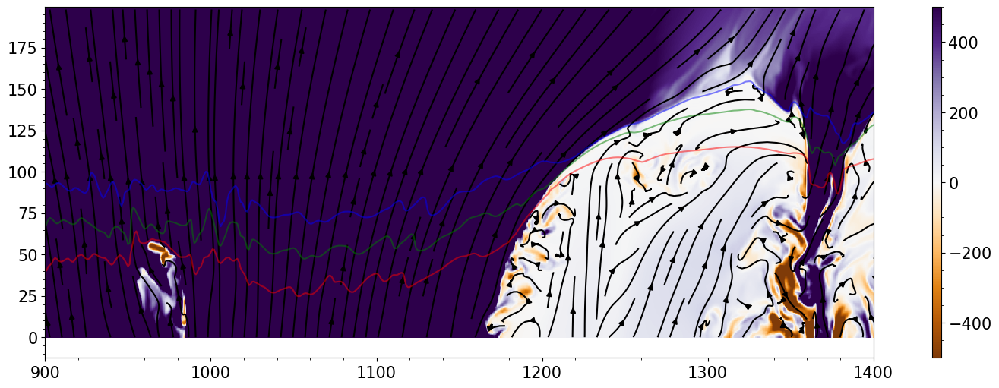

In [29]:
# y 1152
t = 30
plt.figure(figsize=(20,6))
plt.imshow(bz[t,:,700:900].T*np.sqrt(4*np.pi),origin='lower',cmap='PuOr',norm=TwoSlopeNorm(vmin=-500,vcenter=0,vmax=500))
plt.colorbar(aspect=40)
stride = 2
#xsize,ysize = bz[0,:,700:900].shape
xmax = nx//stride
ymax = 200//stride
X,Y = np.meshgrid(stride*np.arange(0,xmax),stride*np.arange(0,ymax))
#plt.quiver(X,Y,np.sqrt(atm0.bx[x1:x2,y,::stride]**2+atm0.by[x1:x2,y,::stride]**2).T,atm0.bz[x1:x2,y,::stride].T,width=.004,color='black')
plt.streamplot(X, Y, bx[t,::stride,700:900:stride].T,bz[t,::stride,700:900:stride].T,density=[7,1],color='black')
plt.contour(tau[t,:,700:900].T,levels=[0.01,0.1,1],colors=['blue','green','red'],alpha=0.5)
plt.xlim([900,1400])

In [33]:
time[1,360]

665.89404296875

(900.0, 1400.0)

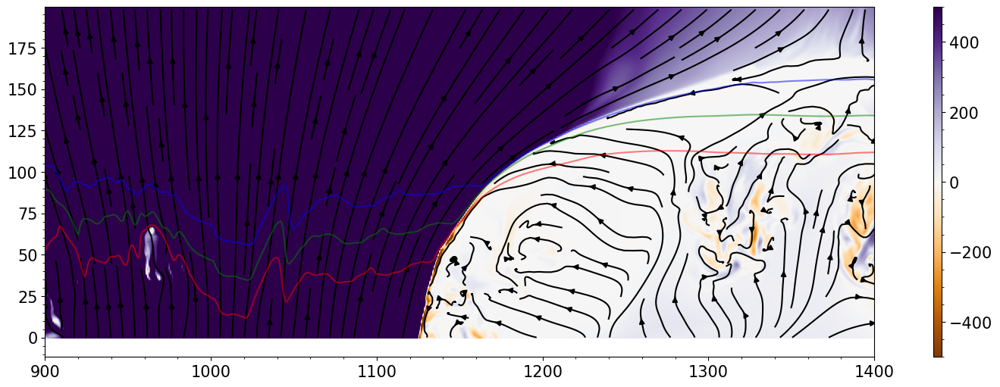

In [ ]:
# y 1152
t = 360
plt.figure(figsize=(20,6))
plt.imshow(bz[t,:,700:900].T*np.sqrt(4*np.pi),origin='lower',cmap='PuOr',norm=TwoSlopeNorm(vmin=-500,vcenter=0,vmax=500))
plt.colorbar(aspect=40)
stride = 2
#xsize,ysize = bz[0,:,700:900].shape
xmax = nx//stride
ymax = 200//stride
X,Y = np.meshgrid(stride*np.arange(0,xmax),stride*np.arange(0,ymax))
#plt.quiver(X,Y,np.sqrt(atm0.bx[x1:x2,y,::stride]**2+atm0.by[x1:x2,y,::stride]**2).T,atm0.bz[x1:x2,y,::stride].T,width=.004,color='black')
plt.streamplot(X, Y, bx[t,::stride,700:900:stride].T,bz[t,::stride,700:900:stride].T,density=[7,1],color='black')
plt.contour(tau[t,:,700:900].T,levels=[0.01,0.1,1],colors=['blue','green','red'],alpha=0.5)
plt.xlim([900,1400])

(800.0, 1400.0)

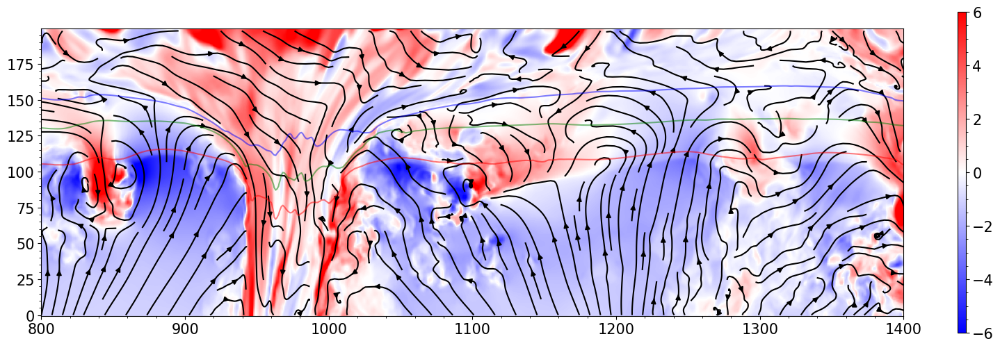

In [13]:
# y 1152
t = 360
plt.figure(figsize=(20,6))
plt.imshow(-vz[t,:,700:900].T/1e5,origin='lower',cmap='bwr',norm=TwoSlopeNorm(vmin=-6,vcenter=0,vmax=6))
plt.colorbar(aspect=40)
stride = 2
#xsize,ysize = bz[0,:,700:900].shape
xmax = nx//stride
ymax = 200//stride
X,Y = np.meshgrid(stride*np.arange(0,xmax),stride*np.arange(0,ymax))
#plt.quiver(X,Y,np.sqrt(atm0.bx[x1:x2,y,::stride]**2+atm0.by[x1:x2,y,::stride]**2).T,atm0.bz[x1:x2,y,::stride].T,width=.004,color='black')
plt.streamplot(X, Y, vx[t,::stride,700:900:stride].T,vz[t,::stride,700:900:stride].T,density=[7,1],color='black')
plt.contour(tau[t,:,700:900].T,levels=[0.01,0.1,1],colors=['blue','green','red'],alpha=0.5)
plt.xlim([800,1400])

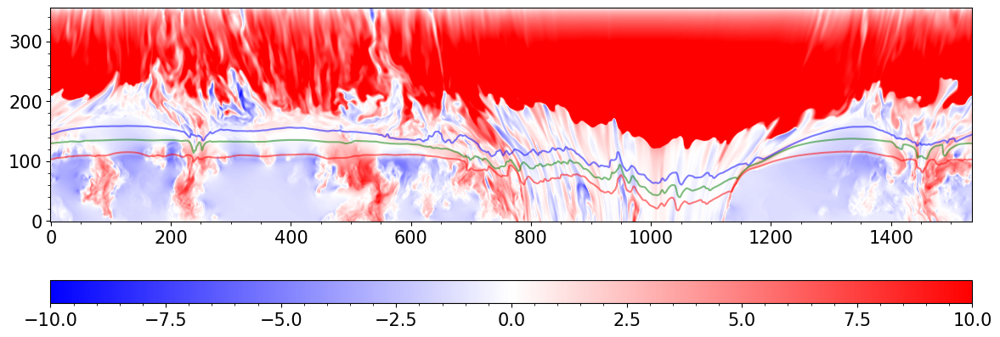

In [15]:
# y 1152
plt.figure(figsize=(14,6))
plt.imshow(-vz[360,:,700:].T/1e5,origin='lower',cmap='bwr',vmin=-10,vmax=10)
plt.colorbar(location='bottom',aspect=40)
plt.contour(tau[360,:,700:].T,levels=[0.01,0.1,1],colors=['blue','green','red'],alpha=0.5)

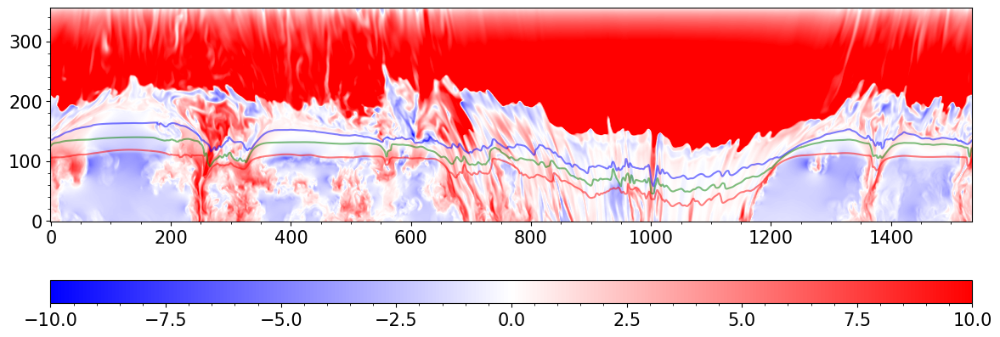

In [190]:
# y 1152
plt.figure(figsize=(14,6))
plt.imshow(-vz[60,:,700:].T/1e5,origin='lower',cmap='bwr',vmin=-10,vmax=10)
plt.colorbar(location='bottom',aspect=40)
plt.contour(tau[60,:,700:].T,levels=[0.01,0.1,1],colors=['blue','green','red'],alpha=0.5)

In [178]:
time[1,130]

338.69927978515625

(600.0, 1000.0)

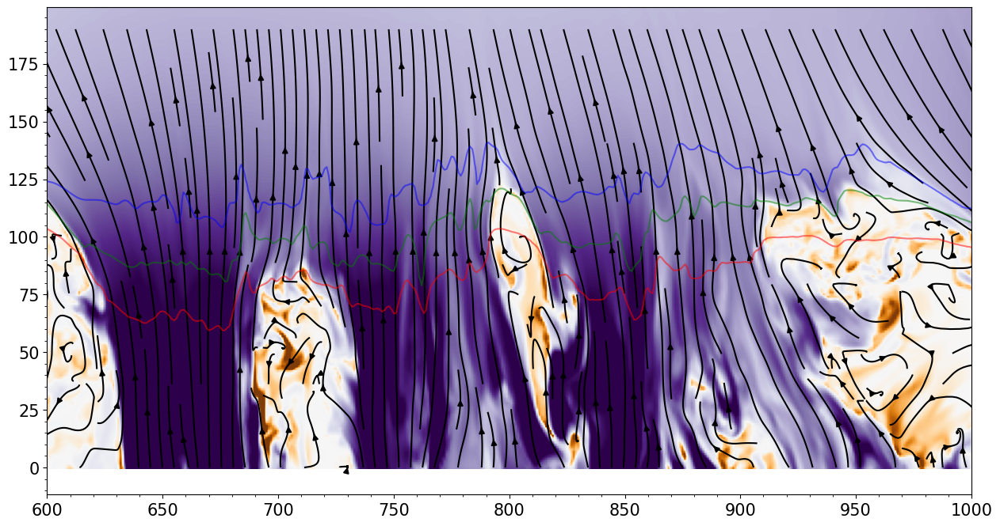

In [88]:
# y 0960
t = 10
plt.figure(figsize=(20,8))
plt.imshow(bz[t,:,700:900].T*np.sqrt(4*np.pi),origin='lower',cmap='PuOr',norm=TwoSlopeNorm(vmin=-500,vcenter=0,vmax=2000))
#plt.colorbar(location='bottom',aspect=40)
stride = 10
#xsize,ysize = bz[0,:,700:900].shape
xmax = nx//stride+1
ymax = 200//stride
X,Y = np.meshgrid(stride*np.arange(0,xmax),stride*np.arange(0,ymax))
#plt.quiver(X,Y,bx[t,::stride,700:900:stride].T,bz[t,::stride,700:900:stride].T,width=.004,color='black')
plt.streamplot(X, Y, bx[t,::stride,700:900:stride].T,bz[t,::stride,700:900:stride].T,density=[10,1],color='black')
plt.contour(tau[t,:,700:900].T,levels=[0.01,0.1,1],colors=['blue','green','red'],alpha=0.5)
plt.xlim([600,1000])

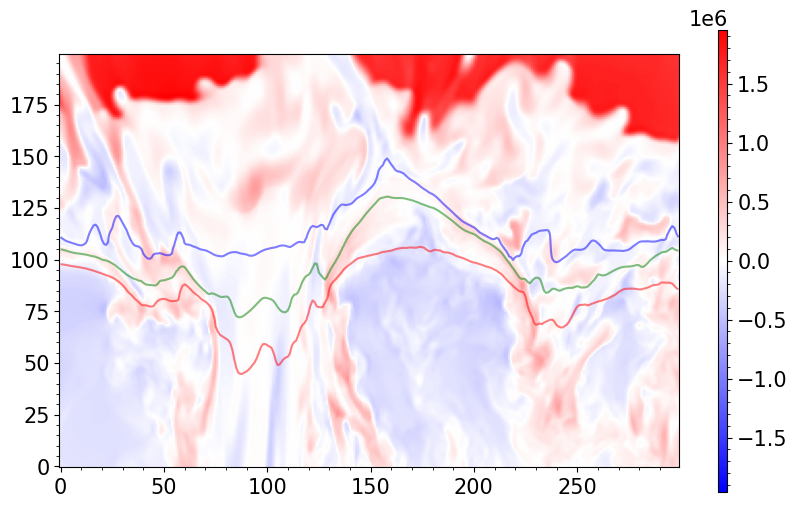

In [182]:
# y 0960
t = 140
plt.figure(figsize=(10,6))
plt.imshow(-slice[t,800:1100,700:900].T,origin='lower',cmap='bwr',norm=CenteredNorm())
plt.colorbar(aspect=50)
plt.contour(tau[t,800:1100,700:900].T,levels=[0.01,0.1,1],colors=['blue','green','red'],alpha=0.5)

(300.0, 1020.0)

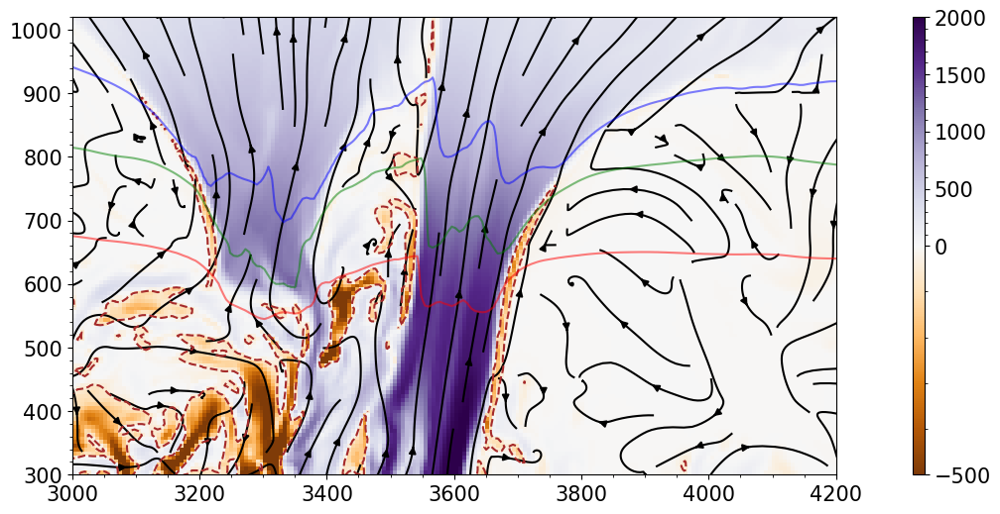

In [52]:
# x 192
t = 100
plt.figure(figsize=(20,6))
plt.imshow(bz[t,:,700:900].T*np.sqrt(4*np.pi),origin='lower',cmap='PuOr',norm=TwoSlopeNorm(vmin=-500,vcenter=0,vmax=2000),extent=[0,1536*6,0,200*6])
plt.colorbar(aspect=40)
stride = 10
#xsize,ysize = bz[0,:,700:900].shape
xmax = nx//stride+1
ymax = 200//stride
X,Y = np.meshgrid(stride*np.arange(0,xmax)*6,stride*np.arange(0,ymax)*6)
#plt.quiver(X,Y,bx[t,::stride,700:900:stride].T,bz[t,::stride,700:900:stride].T,width=.004,color='black')
plt.streamplot(X, Y, bx[t,::stride,700:900:stride].T*np.sqrt(4*np.pi),bz[t,::stride,700:900:stride].T*np.sqrt(4*np.pi),density=[10,1],color='black')
plt.contour(bz[t,:,700:900].T*np.sqrt(4*np.pi),levels=[-50],colors='brown',extent=[0,1536*6,0,200*6])
plt.contour(tau[t,:,700:900].T,levels=[0.01,0.1,1],colors=['blue','green','red'],alpha=0.5,extent=[0,1536*6,0,200*6])
plt.xlim([500*6,700*6])
plt.ylim([50*6,170*6])

(50.0, 170.0)

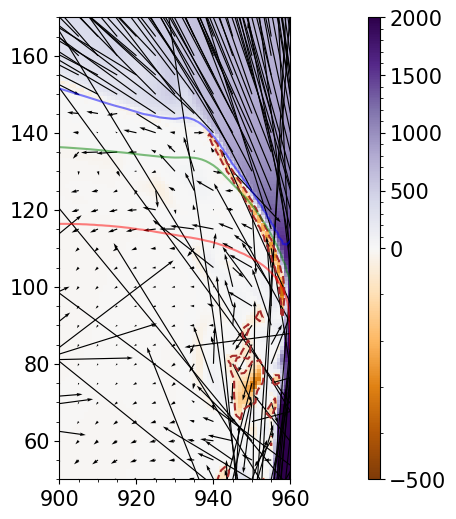

In [ ]:
# y 768
t = 450
plt.figure(figsize=(20,6))
plt.imshow(bz[t,:,700:900].T*np.sqrt(4*np.pi),origin='lower',cmap='PuOr',norm=TwoSlopeNorm(vmin=-500,vcenter=0,vmax=2000))
plt.colorbar(aspect=40)
stride = 5
#xsize,ysize = bz[0,:,700:900].shape
xmax = nx//stride+1
ymax = 200//stride
X,Y = np.meshgrid(stride*np.arange(0,xmax),stride*np.arange(0,ymax))
plt.quiver(X,Y,bx[t,::stride,700:900:stride].T,bz[t,::stride,700:900:stride].T,width=.005,color='black',scale=100)
#plt.streamplot(X, Y, bx[t,::stride,700:900:stride].T*np.sqrt(4*np.pi),bz[t,::stride,700:900:stride].T*np.sqrt(4*np.pi),density=[13,1],color='black')
plt.contour(bz[t,:,700:900].T*np.sqrt(4*np.pi),levels=[-50],colors='brown')
plt.contour(tau[t,:,700:900].T,levels=[0.01,0.1,1],colors=['blue','green','red'],alpha=0.5)
plt.xlim([900,960])
plt.ylim([50,170])

(50.0, 170.0)

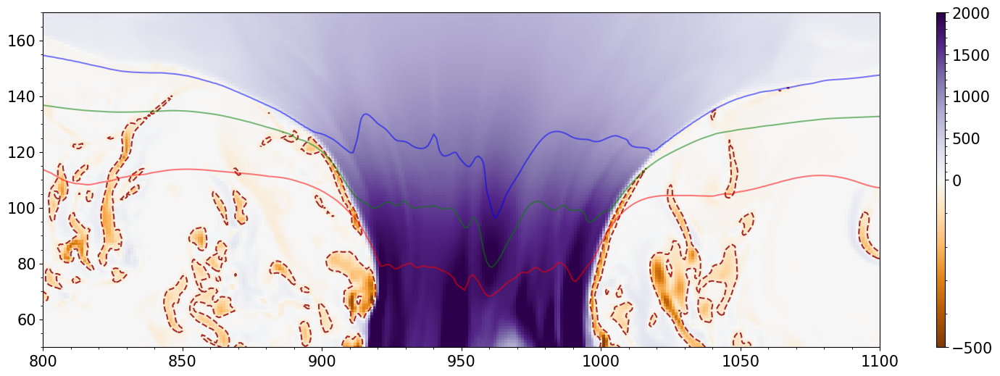

In [14]:
# y 768
t = 160
plt.figure(figsize=(20,6))
plt.imshow(bz[t,:,700:900].T*np.sqrt(4*np.pi),origin='lower',cmap='PuOr',norm=TwoSlopeNorm(vmin=-500,vcenter=0,vmax=2000))
plt.colorbar(aspect=40)
stride = 10
#xsize,ysize = bz[0,:,700:900].shape
xmax = nx//stride+1
ymax = 200//stride
X,Y = np.meshgrid(stride*np.arange(0,xmax),stride*np.arange(0,ymax))
#plt.quiver(X,Y,bx[t,::stride,700:900:stride].T,bz[t,::stride,700:900:stride].T,width=.004,color='black')
#plt.streamplot(X, Y, bx[t,::stride,700:900:stride].T*np.sqrt(4*np.pi),bz[t,::stride,700:900:stride].T*np.sqrt(4*np.pi),density=[10,1],color='black')
plt.contour(bz[t,:,700:900].T*np.sqrt(4*np.pi),levels=[-50],colors='brown')
plt.contour(tau[t,:,700:900].T,levels=[0.01,0.1,1],colors=['blue','green','red'],alpha=0.5)
plt.xlim([800,1100])
plt.ylim([50,170])

Text(0, 0.5, 'z [km]')

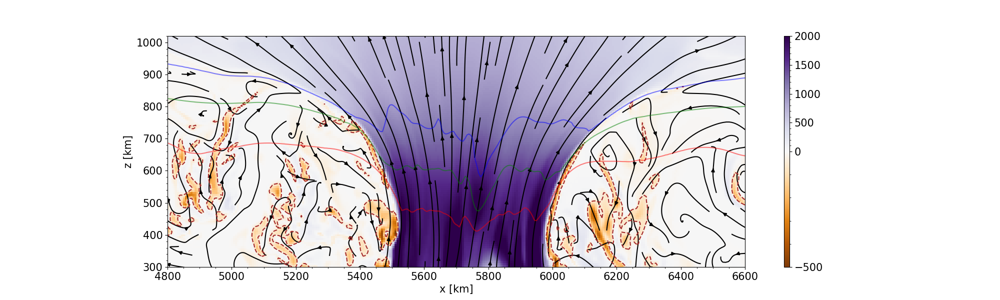

In [12]:
# y 768
t = 160
plt.figure(figsize=(20,6))
plt.imshow(bz[t,:,700:900].T*np.sqrt(4*np.pi),origin='lower',cmap='PuOr',norm=TwoSlopeNorm(vmin=-500,vcenter=0,vmax=2000),extent=[0,1536*6,0,200*6])
plt.colorbar(aspect=40)
stride = 10
#xsize,ysize = bz[0,:,700:900].shape
xmax = nx//stride+1
ymax = 200//stride
X,Y = np.meshgrid(stride*np.arange(0,xmax)*6,stride*np.arange(0,ymax)*6)
#plt.quiver(X,Y,bx[t,::stride,700:900:stride].T,bz[t,::stride,700:900:stride].T,width=.004,color='black')
plt.streamplot(X, Y, bx[t,::stride,700:900:stride].T*np.sqrt(4*np.pi),bz[t,::stride,700:900:stride].T*np.sqrt(4*np.pi),density=[10,1],color='black')
plt.contour(bz[t,:,700:900].T*np.sqrt(4*np.pi),levels=[-50],colors='brown',extent=[0,1536*6,0,200*6])
plt.contour(tau[t,:,700:900].T,levels=[0.01,0.1,1],colors=['blue','green','red'],alpha=0.5,extent=[0,1536*6,0,200*6])
plt.xlim([800*6,1100*6])
plt.ylim([50*6,170*6])
plt.xlabel('x [km]')
plt.ylabel('z [km]')

Text(0, 0.5, 'z [km]')

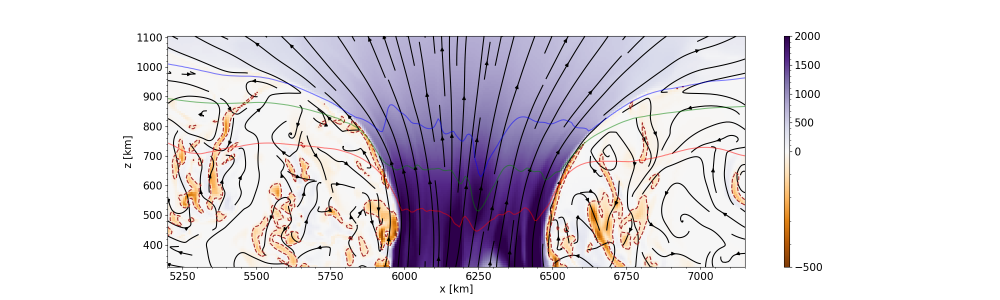

In [ ]:
# y 768
t = 160
plt.figure(figsize=(20,6))
plt.imshow(bz[t,:,700:900].T*np.sqrt(4*np.pi),origin='lower',cmap='PuOr',norm=TwoSlopeNorm(vmin=-500,vcenter=0,vmax=2000),extent=[0,1536*6.5,0,200*6.5])
plt.colorbar(aspect=40)
stride = 10
#xsize,ysize = bz[0,:,700:900].shape
xmax = nx//stride+1
ymax = 200//stride
X,Y = np.meshgrid(stride*np.arange(0,xmax)*6.5,stride*np.arange(0,ymax)*6.5)
#plt.quiver(X,Y,bx[t,::stride,700:900:stride].T,bz[t,::stride,700:900:stride].T,width=.004,color='black')
plt.streamplot(X, Y, bx[t,::stride,700:900:stride].T*np.sqrt(4*np.pi),bz[t,::stride,700:900:stride].T*np.sqrt(4*np.pi),density=[10,1],color='black')
plt.contour(bz[t,:,700:900].T*np.sqrt(4*np.pi),levels=[-50],colors='brown',extent=[0,1536*6.5,0,200*6.5])
plt.contour(tau[t,:,700:900].T,levels=[0.01,0.1,1],colors=['blue','green','red'],alpha=0.5,extent=[0,1536*6.5,0,200*6.5])
plt.xlim([800*6.5,1100*6.5])
plt.ylim([50*6.5,170*6.5])
plt.xlabel('x [km]')
plt.ylabel('z [km]')

In [10]:
bz_new = bz.reshape(nsnaps,nx//8,8,nz//2,2).mean(axis=(2,4))


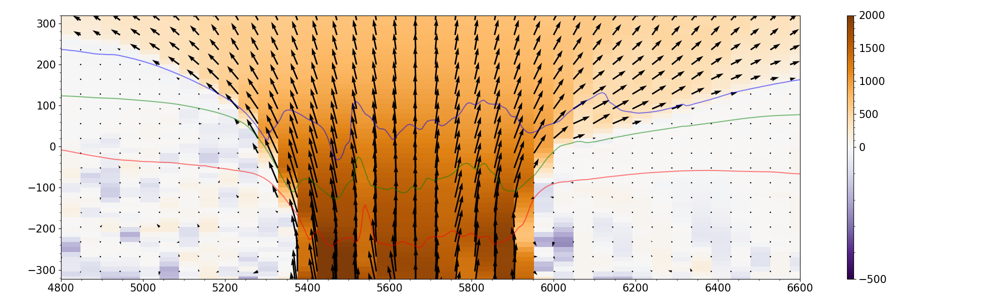

In [13]:
t = 10
plt.figure(figsize=(20,6))
plt.imshow(bz_new[t,:,700//2:900//2].T*np.sqrt(4*np.pi),origin='lower',cmap='PuOr_r',norm=TwoSlopeNorm(vmin=-500,vcenter=0,vmax=2000),extent=[0,nx*6,0-700,200*6-700])
plt.colorbar(aspect=40)
stride = 3
#xsize,ysize = bz[0,:,700:900].shape
xmax = nx//8
ymax = 100//stride+1
X,Y = np.meshgrid(np.arange(0,xmax)*8*6,stride*np.arange(0,ymax)*2*6-700)
plt.quiver(X,Y,bx.reshape(nsnaps,nx//8,8,nz//2,2).mean(axis=(2,4))[t,::,700//2:900//2:stride].T,bz_new[t,::,700//2:900//2:stride].T,width=.002,color='black')
#plt.streamplot(X, Y, bx[t,::stride,700:900:stride].T,bz[t,::stride,700:900:stride].T,density=[10,1],color='black')
plt.contour(tau[t,:,700:900].T,levels=[0.01,0.1,1],colors=['blue','green','red'],alpha=0.5,extent=[0,nx*6,0-700,200*6-700])
plt.xlim([800*6,1100*6])
plt.ylim([63*6-700,170*6-700])
plt.tight_layout()

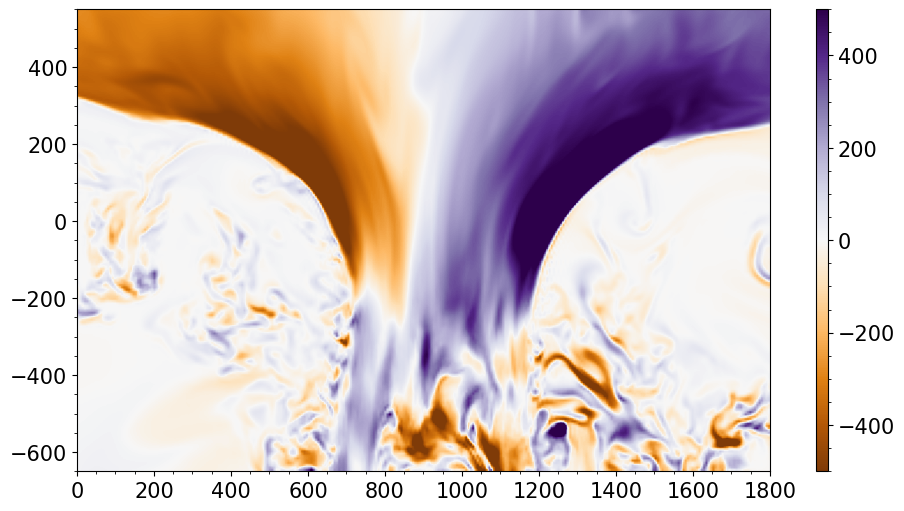

In [17]:
plt.figure(figsize=(12,6))
plt.imshow(bx[160,800:1100,700:900].T*np.sqrt(4*np.pi),origin='lower',cmap='PuOr',norm=TwoSlopeNorm(vmin=-500,vcenter=0,vmax=500),extent=[0,300*6,0-650,200*6-650])
plt.colorbar(aspect=40)
#plt.contour(tau[450,800:1100,700:900].T,levels=[0.01,0.1,1],colors=['blue','green','red'],alpha=0.5,extent=[0,300*6,0-650,200*6-650])

(800.0, 1100.0)

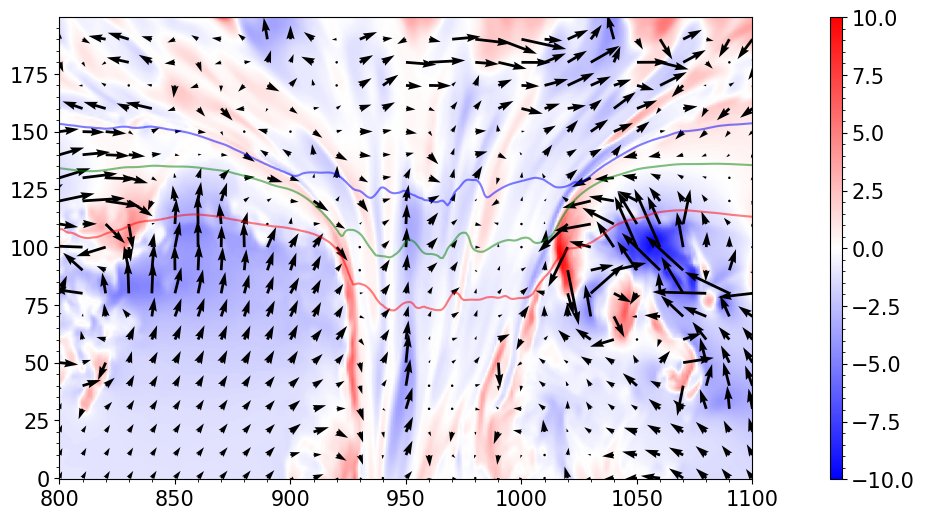

In [124]:
# x 1152
t = 260
plt.figure(figsize=(20,6))
plt.imshow(-vz[t,:,700:900].T/1e5,origin='lower',cmap='bwr',norm=TwoSlopeNorm(vmin=-10,vcenter=0,vmax=10))
plt.colorbar(aspect=40)
stride = 10
#xsize,ysize = bz[0,:,700:900].shape
xmax = nx//stride+1
ymax = 200//stride
X,Y = np.meshgrid(stride*np.arange(0,xmax),stride*np.arange(0,ymax))
plt.quiver(X,Y,vx[t,::stride,700:900:stride].T,vz[t,::stride,700:900:stride].T,width=.004,color='black',scale = 1e7)
#plt.streamplot(X, Y, vx[t,::stride,700:900:stride].T,vz[t,::stride,700:900:stride].T,density=[10,1],color='black')
plt.contour(tau[t,:,700:900].T,levels=[0.01,0.1,1],colors=['blue','green','red'],alpha=0.5)
plt.xlim([800,1100])

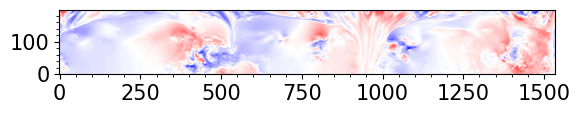

In [99]:
plt.imshow(vx[t,:,700:900].T/1e5,origin='lower',cmap='bwr',norm=TwoSlopeNorm(vmin=-10,vcenter=0,vmax=10))
#plt.colorbar(aspect=40)

In [10]:
slice = np.memmap(muramdir+'2D/Pore_10Mm_6x6km_res_Bz400G_z_0768_T_012000_to_044450.dat',dtype=np.float32,mode='r',shape=(nsnaps,nx,nz))

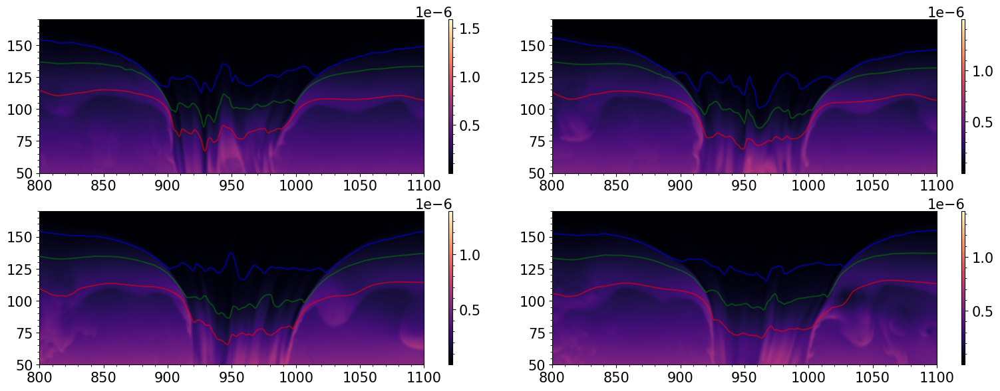

In [ ]:
t = 100
dt = 50
plt.figure(figsize=(16,6))
plt.subplot(221)
plt.imshow(slice[t,:,700:900].T,origin='lower',cmap='magma')
plt.colorbar(aspect=40)
plt.contour(tau[t,:,700:900].T,levels=[0.01,0.1,1],colors=['blue','green','red'],alpha=0.5)
plt.xlim([800,1100])
plt.ylim([50,170])
plt.subplot(222)
plt.imshow(slice[t+dt,:,700:900].T,origin='lower',cmap='magma')
plt.colorbar(aspect=40)
plt.contour(tau[t+dt,:,700:900].T,levels=[0.01,0.1,1],colors=['blue','green','red'],alpha=0.5)
plt.xlim([800,1100])
plt.ylim([50,170])
plt.subplot(223)
plt.imshow(slice[t+dt*2,:,700:900].T,origin='lower',cmap='magma')
plt.colorbar(aspect=40)
plt.contour(tau[t+dt*2,:,700:900].T,levels=[0.01,0.1,1],colors=['blue','green','red'],alpha=0.5)
plt.xlim([800,1100])
plt.ylim([50,170])
plt.subplot(224)
plt.imshow(slice[t+dt*3,:,700:900].T,origin='lower',cmap='magma')
plt.colorbar(aspect=40)
plt.contour(tau[t+dt*3,:,700:900].T,levels=[0.01,0.1,1],colors=['blue','green','red'],alpha=0.5)
plt.xlim([800,1100])
plt.ylim([50,170])
plt.tight_layout()

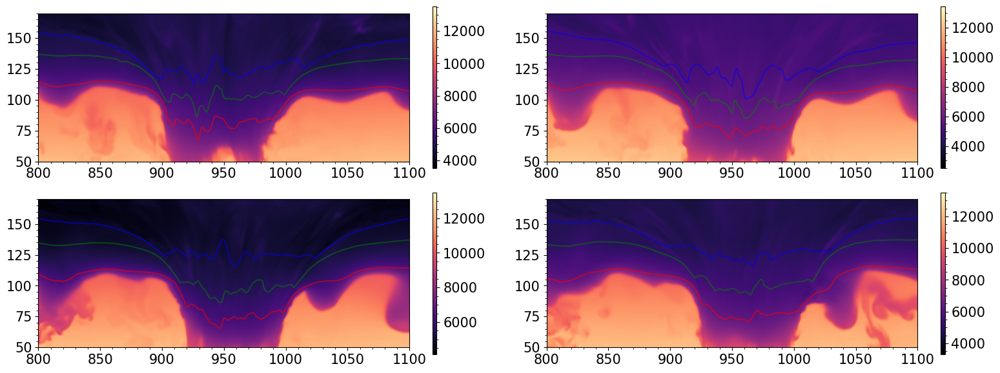

In [11]:
t = 100
dt = 50
plt.figure(figsize=(16,6))
plt.subplot(221)
plt.imshow(slice[t,:,700:900].T,origin='lower',cmap='magma')
plt.colorbar(aspect=40)
plt.contour(tau[t,:,700:900].T,levels=[0.01,0.1,1],colors=['blue','green','red'],alpha=0.5)
plt.xlim([800,1100])
plt.ylim([50,170])
plt.subplot(222)
plt.imshow(slice[t+dt,:,700:900].T,origin='lower',cmap='magma')
plt.colorbar(aspect=40)
plt.contour(tau[t+dt,:,700:900].T,levels=[0.01,0.1,1],colors=['blue','green','red'],alpha=0.5)
plt.xlim([800,1100])
plt.ylim([50,170])
plt.subplot(223)
plt.imshow(slice[t+dt*2,:,700:900].T,origin='lower',cmap='magma')
plt.colorbar(aspect=40)
plt.contour(tau[t+dt*2,:,700:900].T,levels=[0.01,0.1,1],colors=['blue','green','red'],alpha=0.5)
plt.xlim([800,1100])
plt.ylim([50,170])
plt.subplot(224)
plt.imshow(slice[t+dt*3,:,700:900].T,origin='lower',cmap='magma')
plt.colorbar(aspect=40)
plt.contour(tau[t+dt*3,:,700:900].T,levels=[0.01,0.1,1],colors=['blue','green','red'],alpha=0.5)
plt.xlim([800,1100])
plt.ylim([50,170])
plt.tight_layout()

In [28]:
1536*6

9216

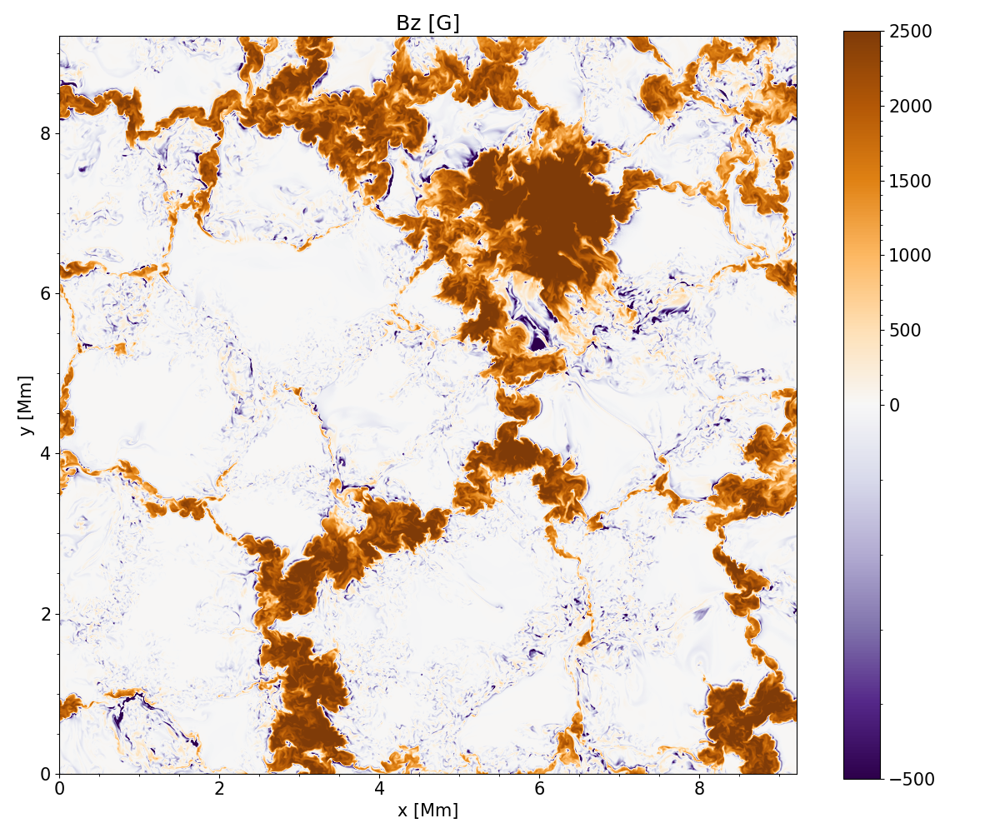

In [38]:
import matplotlib.colors as mcolors
cmap = mcolors.LinearSegmentedColormap.from_list("custom_div", ["orange", "white", "purple"])
plt.figure(figsize=(12,10))
t = 150
plt.imshow(slicez[t,:,:].T*np.sqrt(4*np.pi),origin='lower',cmap='PuOr_r',norm=TwoSlopeNorm(vmin=-500,vcenter=0,vmax=2500),extent=[0,9.216,0,1536*6/1000])
plt.colorbar()
plt.xlabel('x [Mm]')
plt.ylabel('y [Mm]')
plt.title('Bz [G]')
#plt.xlim([4.8,6.6])
#plt.ylim([3.7,5.3])
plt.tight_layout()

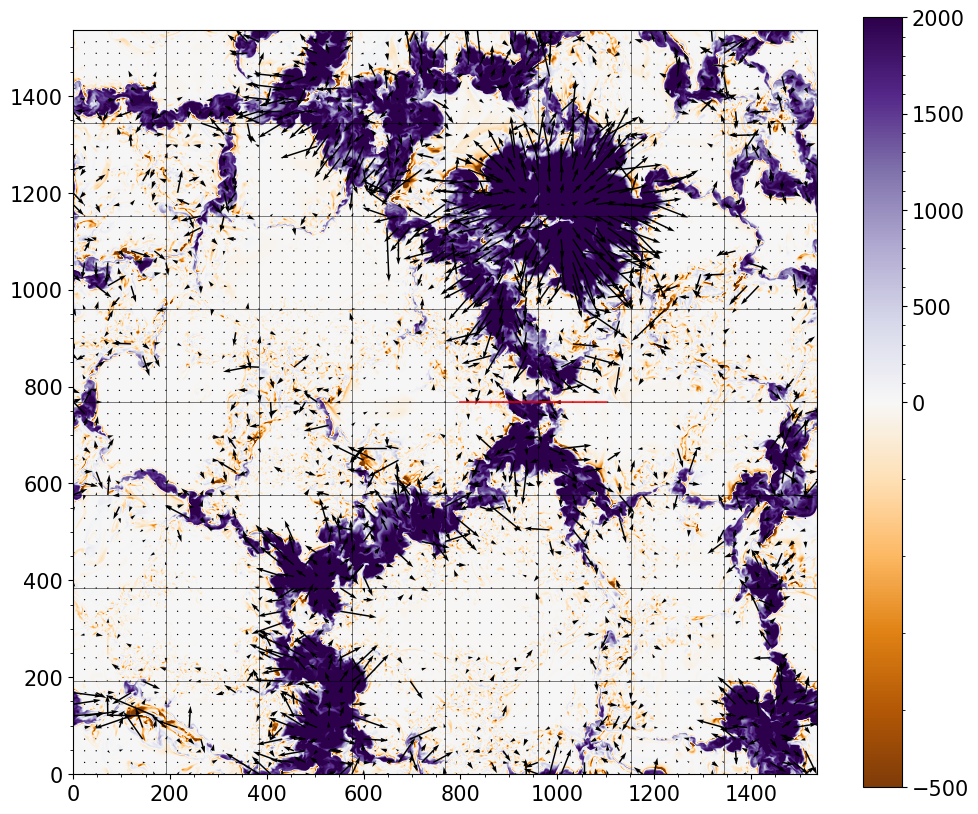

In [32]:
plt.figure(figsize=(12,10))
t = 10
plt.imshow(slicez[t,:,:].T*np.sqrt(4*np.pi),origin='lower',cmap='PuOr',norm=TwoSlopeNorm(vmin=-500,vcenter=0,vmax=2000))
plt.colorbar()
stride = 24
xsize,ysize = nx, ny
xmax = int(xsize/stride)
ymax = int(ysize/stride)
X,Y = np.meshgrid(stride*np.arange(0,xmax),stride*np.arange(0,ymax))
plt.quiver(X,Y,slicex[t,::stride,::stride].T,slicey[t,::stride,::stride].T,width=.002)
for pt in np.array([0,192,384,576,768,960,1152,1344]):
   plt.axvline(pt, lw=0.5, color='black', alpha=0.7)
   plt.axhline(pt, lw=0.5, color='black', alpha=0.7)
plt.plot([800,1100],[768,768],color='r',alpha=0.7)

In [35]:
slicez = np.memmap(muramdir+'2D/Pore_10Mm_6x6km_res_Bz400G_tau_1.000_vx_012000_to_044450.dat',dtype=np.float32,mode='r',shape=(nsnaps,nx,ny))

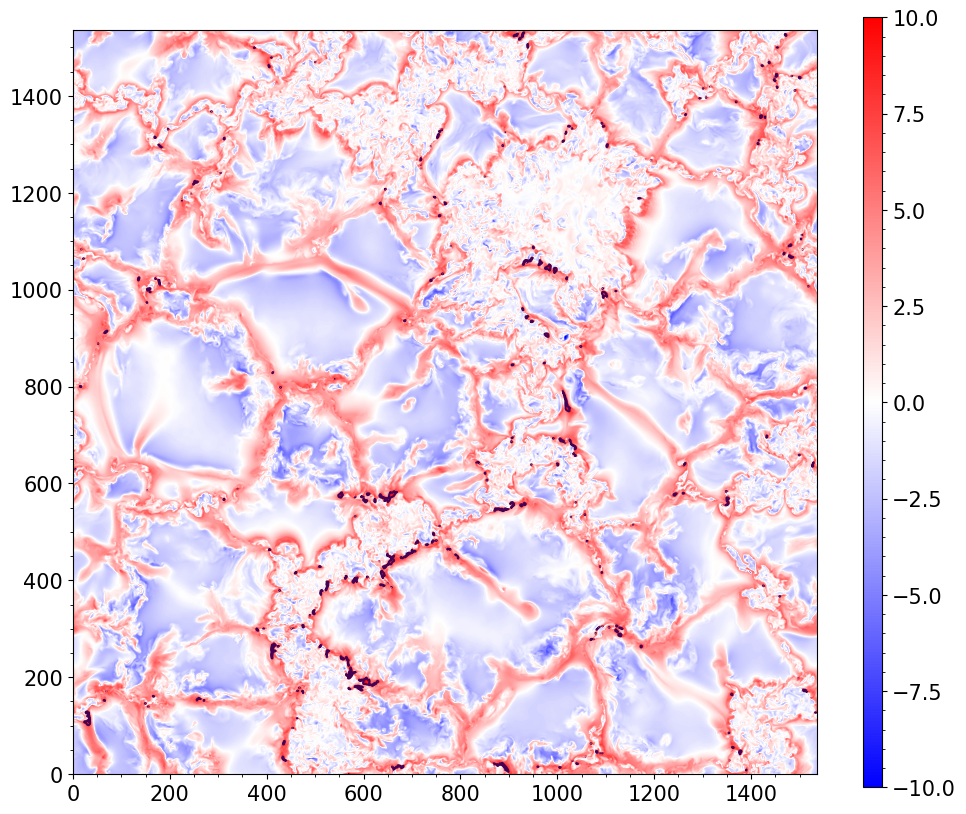

In [40]:
plt.figure(figsize=(12,10))
t = 260
plt.imshow(-slicez[t,:,:].T/1e5,origin='lower',cmap='bwr',vmin=-10,vmax=10)
plt.colorbar(aspect=40)
plt.contour(-slicez[t,:,:].T/1e5,levels=[8])

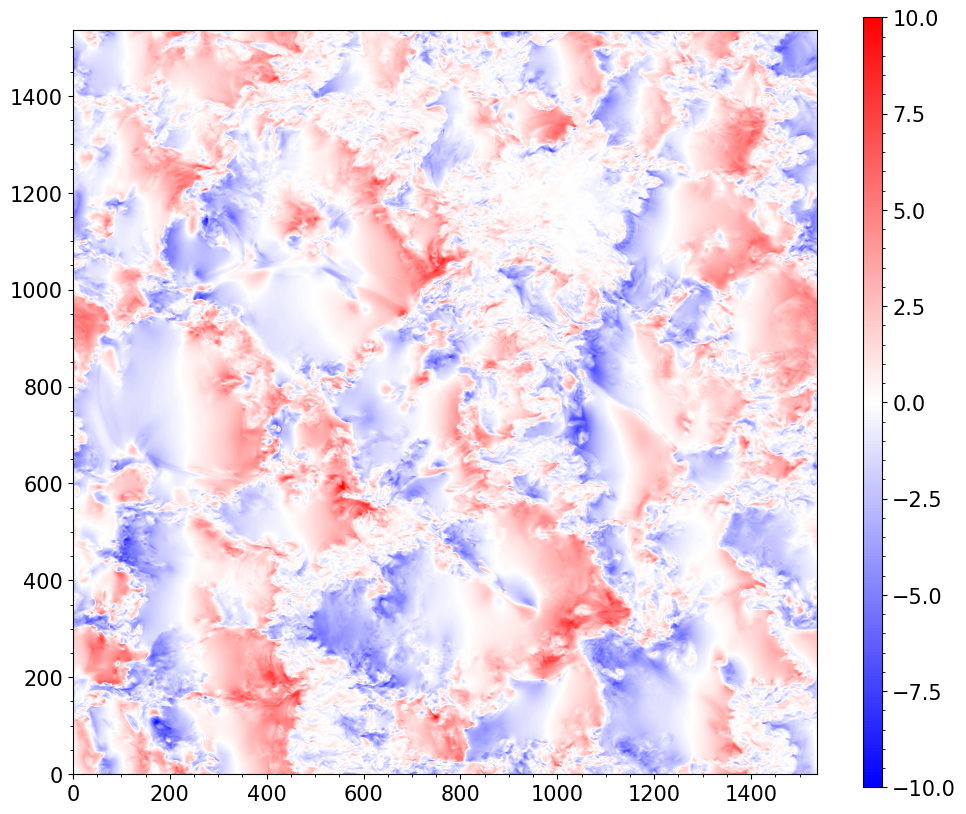

In [34]:
plt.figure(figsize=(12,10))
t = 260
plt.imshow(slicez[t,:,:].T/1e5,origin='lower',cmap='bwr',vmin=-10,vmax=10)
plt.colorbar(aspect=40)

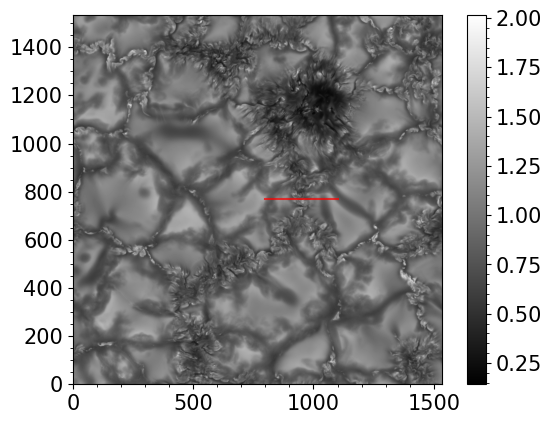

In [31]:
plt.imshow(Ic[160,:,:].T/np.mean(Ic[160,200:600,600:1000]),origin='lower',cmap='gray')
plt.colorbar()
plt.plot([800,1100],[768,768],color='r',alpha=0.7)

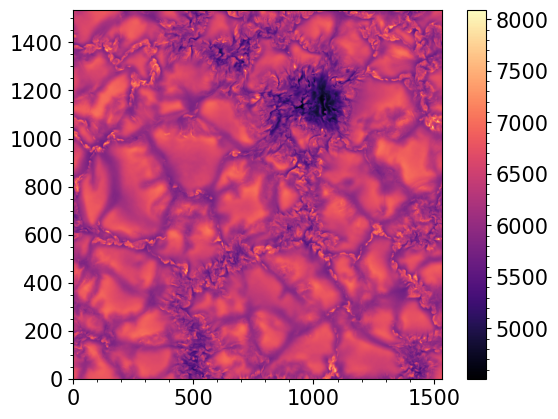

In [22]:
plt.imshow(slice[360,:,:].T,origin='lower',cmap='magma')
plt.colorbar()

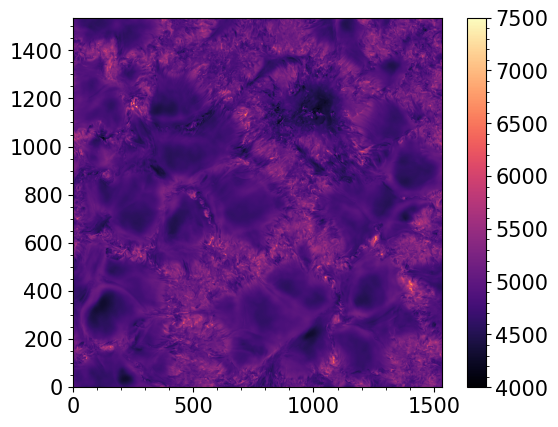

In [11]:
plt.imshow(slice[160,:,:].T,origin='lower',cmap='magma',vmin=4000,vmax=7500)
plt.colorbar()

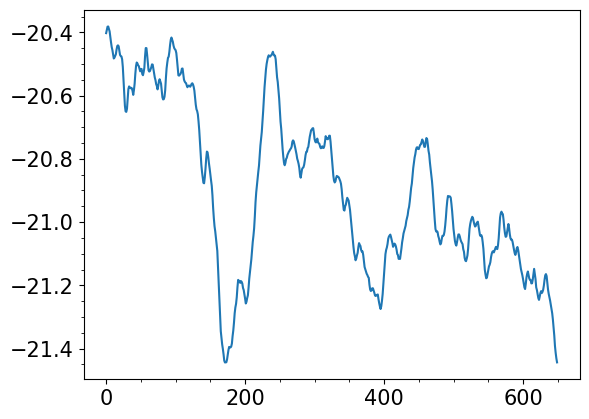

In [10]:
plt.plot(np.mean(slice[:,:,:]-np.abs(slice[:,:,:]),axis=(1,2))*np.sqrt(4*np.pi)/2)

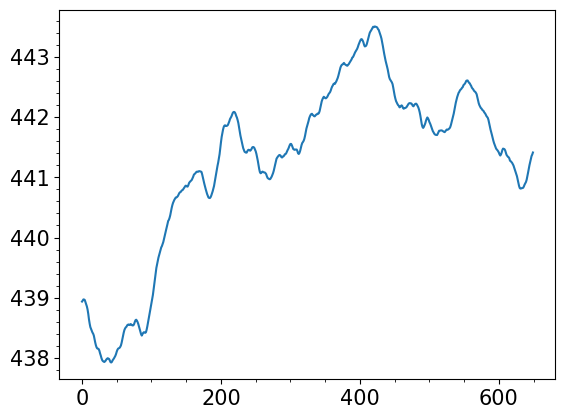

In [11]:
plt.plot(np.mean(slice[:,:,:]+np.abs(slice[:,:,:]),axis=(1,2))*np.sqrt(4*np.pi)/2)

In [34]:
slice = np.memmap(muramdir+'2D/Pore_10Mm_6x6km_res_Bz400G_tau_0.100_vx_012000_to_044450.dat',dtype=np.float32,mode='r',shape=(nsnaps,nx,ny))

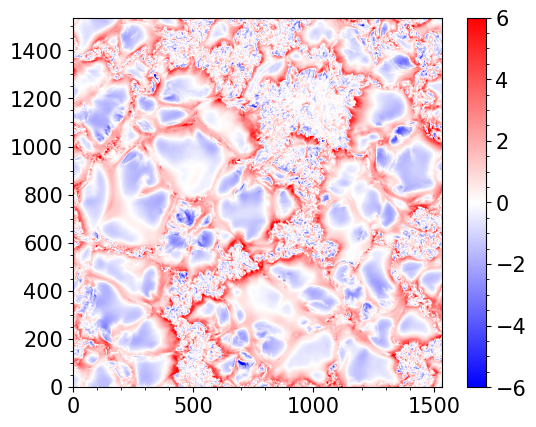

In [35]:
plt.imshow(-slice[360,:,:].T/1e5,origin='lower',cmap='bwr',vmin=-6,vmax=6)
plt.colorbar()

In [36]:
cb = np.zeros((192,192))
cb[:,:] = np.sum(slice[360,:,:].reshape(192,8,192,8),axis=(1,3))/ (8*8)

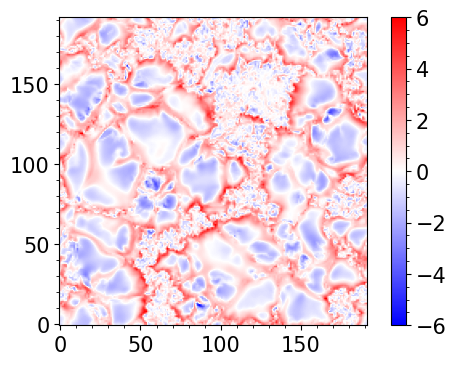

In [38]:
plt.figure(figsize=(6,4))
plt.imshow(-cb[:,:].T/1e5,cmap='bwr',origin='lower',vmin=-6,vmax=6)
plt.colorbar()

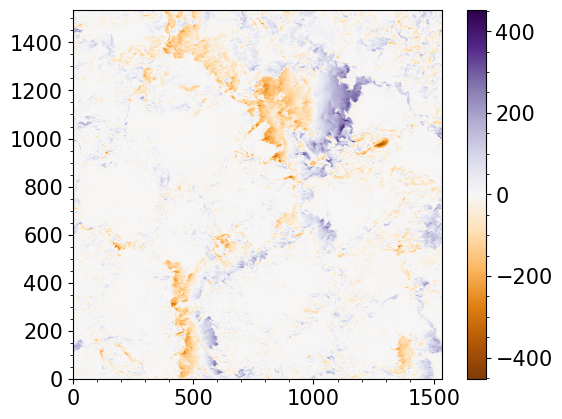

In [129]:
plt.imshow(slicex[160,:,:].T,origin='lower',cmap='PuOr',norm=CenteredNorm())
plt.colorbar()

In [66]:
c = slicez[160,:,:]*np.sqrt(4*np.pi)<-50
c1 = slice[160,:,:]*np.sqrt(4*np.pi)>300
oppo = np.argwhere(c&c1)
oppo.shape

(118649, 2)

In [67]:
oppo.shape[0]/1536/1536

0.05029000176323784

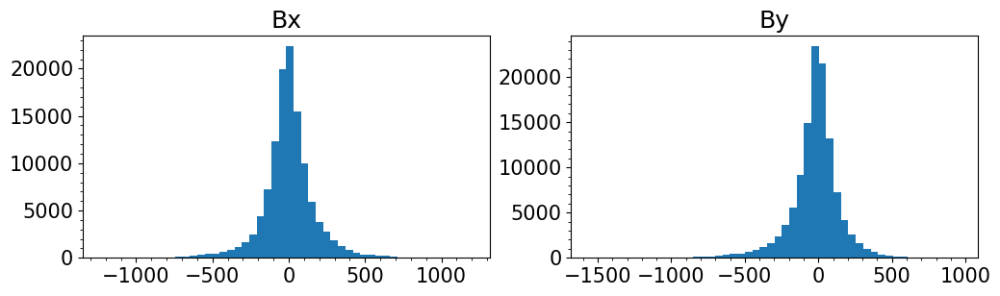

In [70]:
plt.figure(figsize=(12,3))
plt.subplot(121)
plt.hist(slicex[160,oppo[:,0],oppo[:,1]].flatten()*np.sqrt(4*np.pi),bins=50)
plt.title('Bx')
plt.subplot(122)
plt.hist(slicey[160,oppo[:,0],oppo[:,1]].flatten()*np.sqrt(4*np.pi),bins=50)
plt.title('By')
plt.show()


In [71]:
print(np.std(slicex[160,oppo[:,0],oppo[:,1]])*np.sqrt(4*np.pi))
print(np.std(slicey[160,oppo[:,0],oppo[:,1]])*np.sqrt(4*np.pi))

170.40049372980369
171.0787407646091


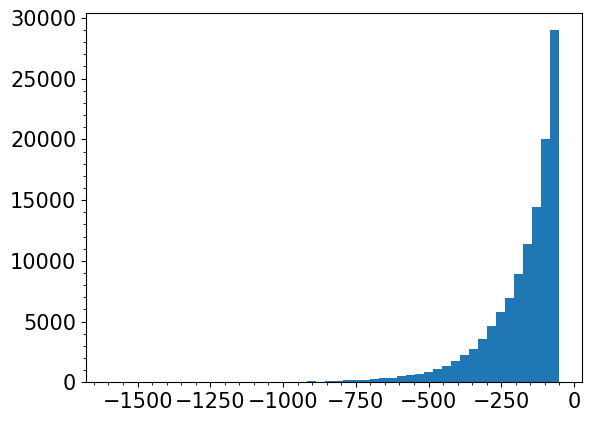

In [69]:
plt.hist(slicez[160,oppo[:,0],oppo[:,1]].flatten()*np.sqrt(4*np.pi),bins=50)
plt.show()

In [68]:
np.mean(slicez[160,oppo[:,0],oppo[:,1]])*np.sqrt(4*np.pi)

-179.71504487136576

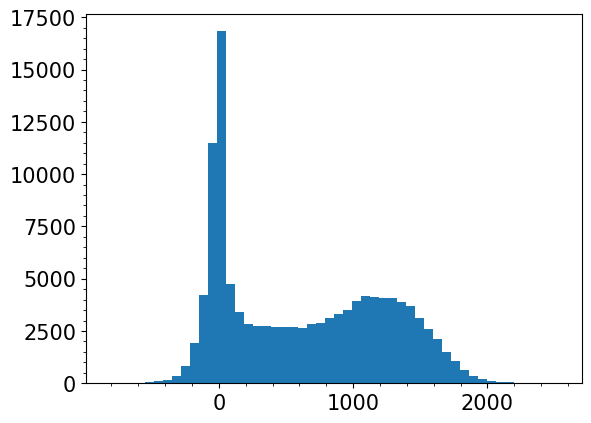

In [74]:
plt.hist(slice[160,oppo[:,0],oppo[:,1]].flatten()*np.sqrt(4*np.pi),bins=50)
plt.show()

In [73]:
np.mean(slice[160,oppo[:,0],oppo[:,1]])*np.sqrt(4*np.pi)

622.9421257408669

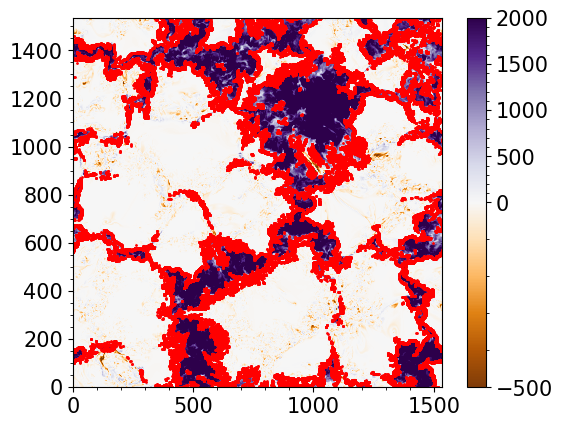

In [77]:
plt.imshow(slicez[160,:,:].T*np.sqrt(4*np.pi),origin='lower',cmap='PuOr',norm=TwoSlopeNorm(vmin=-500,vcenter=0,vmax=2000))
plt.colorbar()
plt.scatter(oppo[:,0],oppo[:,1],c='r',s=1)

In [ ]:
plt.figure(figsize=(16,13))
plt.imshow(slice[160,:,:].T,origin='lower')

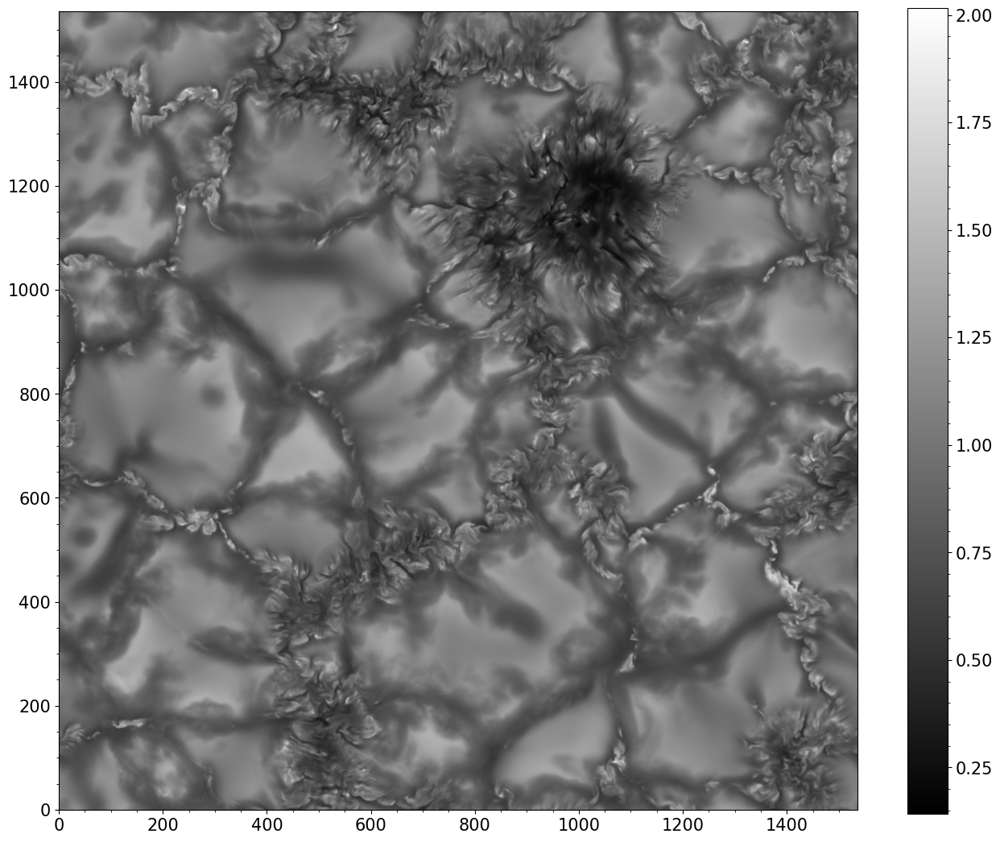

In [28]:
plt.figure(figsize=(16,13))
plt.imshow(Ic[160,:,:].T/np.mean(Ic[160,200:600,600:1000]),origin='lower',cmap='gray')
plt.colorbar()

In [10]:
I = np.zeros_like(Ic)
for t in range(nsnaps):
    I[t,:,:] = Ic[t,:,:]/np.mean(Ic[t,200:600,600:1000])

In [19]:
t = 100
np.std(I[t,:,:])

0.2101757

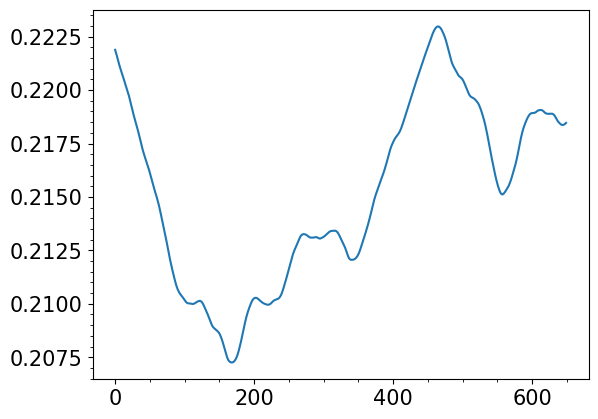

In [21]:
plt.plot(np.std(I,axis=(1,2)))

Text(0, 0.5, 'y [km]')

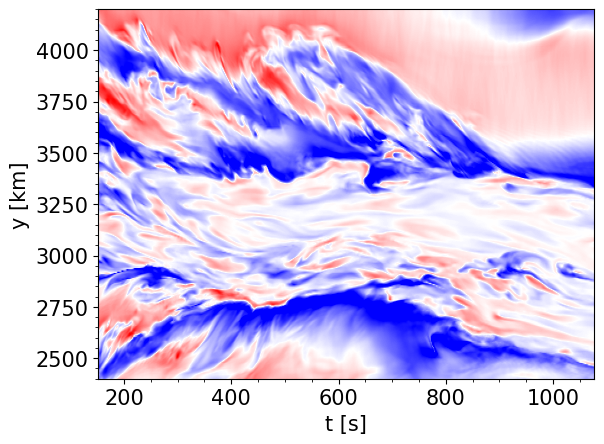

In [10]:
#fig, ax = plt.subplots()
plt.imshow(slice[:,700,400:700].T/1e5,origin='lower',cmap='bwr',vmax=6,vmin=-6,extent=[time[1,0],time[1,-1],400*6,700*6])
plt.gca().set_aspect('auto')
#ax.set_aspect('auto')
plt.xlabel('t [s]')
plt.ylabel('y [km]')

Text(0, 0.5, 'y [km]')

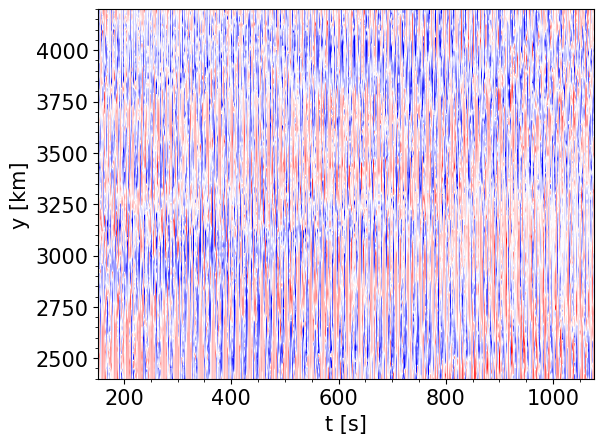

In [30]:
#fig, ax = plt.subplots()
plt.imshow(slice[:,700,400:700].T/1e5,origin='lower',cmap='bwr',vmax=6,vmin=-6,extent=[time[1,0],time[1,-1],400*6,700*6])
plt.gca().set_aspect('auto')
#ax.set_aspect('auto')
plt.xlabel('t [s]')
plt.ylabel('y [km]')

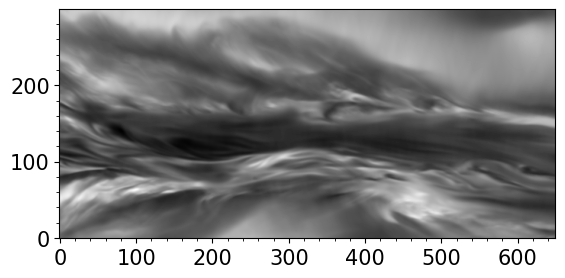

In [15]:
plt.imshow(I[:,700,400:700].T,origin='lower',cmap='gray')

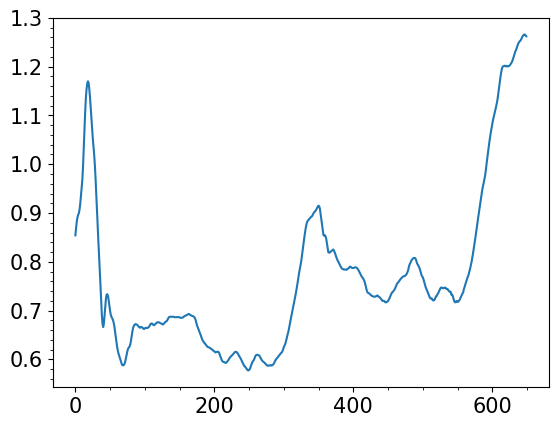

In [14]:
plt.plot(I[:,700,550])

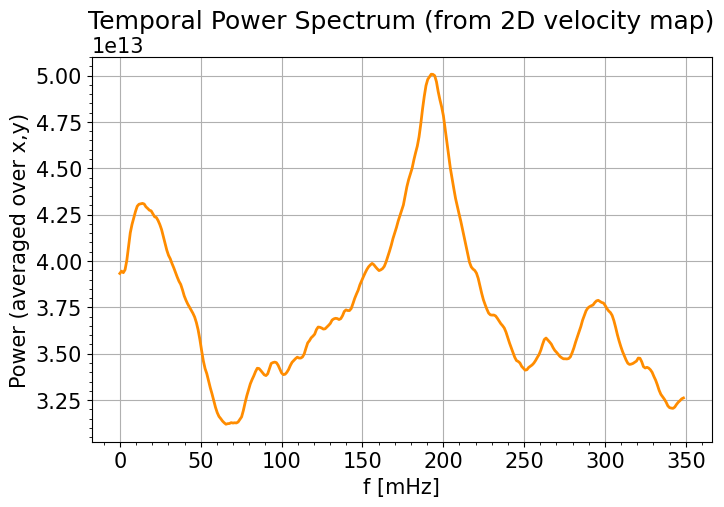

In [9]:
# --- 1. Create a synthetic velocity cube: v(x, y, t) ---
#nx, ny = 64, 64        # spatial grid
nt = 650                # number of time steps
dt = 1.43               # time cadence [s] (e.g., HMI = 45 sec)
#t = np.arange(nt) * dt  # time array

# Simulate an oscillation with a known frequency
freq = 3.0e-3  # Hz (3 mHz, typical solar p-mode)
omega_true = 2 * np.pi * freq

# Create a wave pattern that oscillates in time and space
#kx, ky = 0.1, 0.05  # spatial wave numbers [1/Mm, arbitrary units]
#x = np.arange(nx)
#y = np.arange(ny)
#X, Y = np.meshgrid(x, y)

#v = np.zeros((ny, nx, nt))
#for i, ti in enumerate(t):
#    v[:, :, i] = np.sin(kx * X + ky * Y + omega_true * ti)

# --- 2. Compute the temporal FFT for each pixel ---
#v_fft = np.fft.fft(atm[:,5,:,:,100], axis=0)
v_fft = np.fft.fft(slice[:,:,:], axis=0)
freqs = np.fft.fftfreq(nt, dt)  # temporal frequencies (Hz)
omega = 2 * np.pi * freqs       # angular frequency (rad/s)

# --- 3. Compute the power spectrum (average over space) ---
power_spectrum = np.mean(np.abs(v_fft)**2, axis=(0,1))
half = nt // 2                  # keep positive frequencies
omega_pos = omega[:half]
power_pos = power_spectrum[:half]
freqs_pos = freqs[:half] *1e3


# --- 4. Plot the temporal power spectrum ---
plt.figure(figsize=(8,5))
plt.plot(freqs_pos, power_pos, color='darkorange', lw=2)
plt.xlabel(r'f [mHz]')
plt.ylabel('Power (averaged over x,y)')
plt.title('Temporal Power Spectrum (from 2D velocity map)')
plt.grid(True)
plt.show()

In [13]:
power_spectrum.shape

()

(0.0, 20.0)

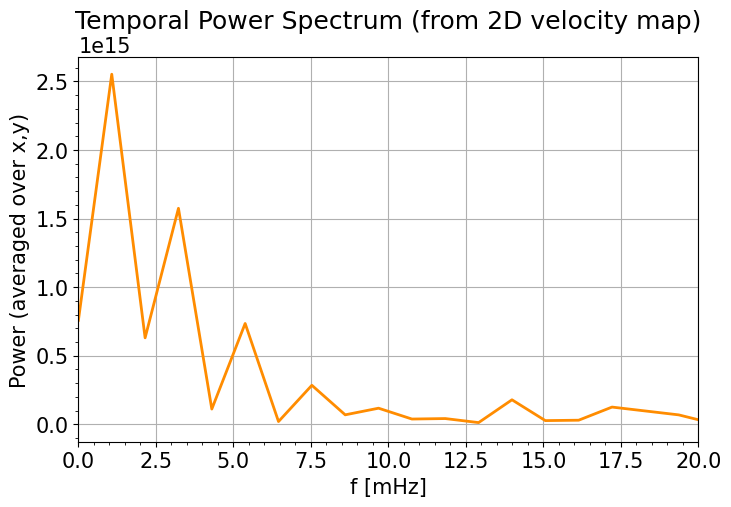

In [28]:
# --- 2. Compute the temporal FFT for each pixel ---
#v_fft = np.fft.fft(atm[:,5,:,:,100], axis=0)
v_fft = np.fft.fft(slice[:,768,1010])
freqs = np.fft.fftfreq(nt, dt)  # temporal frequencies (Hz)
omega = 2 * np.pi * freqs       # angular frequency (rad/s)

# --- 3. Compute the power spectrum (average over space) ---
power_spectrum = np.abs(v_fft)**2
half = nt // 2                  # keep positive frequencies
omega_pos = omega[:half]
power_pos = power_spectrum[:half]
freqs_pos = freqs[:half] *1e3


# --- 4. Plot the temporal power spectrum ---
plt.figure(figsize=(8,5))
plt.plot(freqs_pos, power_pos, color='darkorange', lw=2)
plt.xlabel(r'f [mHz]')
plt.ylabel('Power (averaged over x,y)')
plt.title('Temporal Power Spectrum (from 2D velocity map)')
plt.grid(True)
plt.xlim([0,20])

(0.0, 20.0)

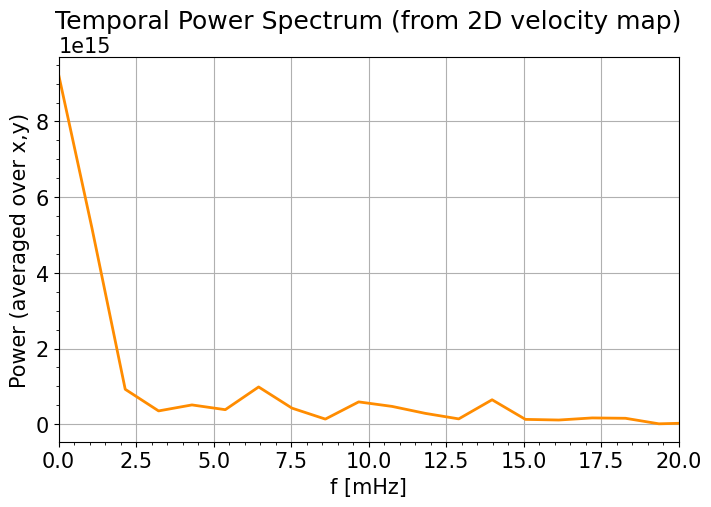

In [30]:
# --- 2. Compute the temporal FFT for each pixel ---
#v_fft = np.fft.fft(atm[:,5,:,:,100], axis=0)
v_fft = np.fft.fft(slice[:,1010,768])
freqs = np.fft.fftfreq(nt, dt)  # temporal frequencies (Hz)
omega = 2 * np.pi * freqs       # angular frequency (rad/s)

# --- 3. Compute the power spectrum (average over space) ---
power_spectrum = np.abs(v_fft)**2
half = nt // 2                  # keep positive frequencies
omega_pos = omega[:half]
power_pos = power_spectrum[:half]
freqs_pos = freqs[:half] *1e3


# --- 4. Plot the temporal power spectrum ---
plt.figure(figsize=(8,5))
plt.plot(freqs_pos, power_pos, color='darkorange', lw=2)
plt.xlabel(r'f [mHz]')
plt.ylabel('Power (averaged over x,y)')
plt.title('Temporal Power Spectrum (from 2D velocity map)')
plt.grid(True)
plt.xlim([0,20])

In [29]:
dominant_idx = np.argmax(omega_pos)
print(f"Dominant angular frequency ω ≈ {omega_pos[dominant_idx]:.3e} rad/s")
print(f"Expected ω = {omega_true:.3e} rad/s")

Dominant angular frequency ω ≈ 2.190e+00 rad/s
Expected ω = 1.885e-02 rad/s


In [48]:
%matplotlib widget
plt.imshow(-slice[0,:,:].T,origin='lower',cmap='bwr')
plt.axvline(768)
plt.axhline(1010)
plt.axhline(768)
plt.axvline(1010)